In [1]:
import os
import cv2
import PIL
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

from matplotlib.gridspec import GridSpec

### 데이터 가져오기

In [2]:
import pathlib
dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file('flower_photos', origin=dataset_url, untar=True)
data_dir = pathlib.Path(data_dir)

In [3]:
flower_list = [s for s in os.listdir(data_dir) if 'txt' not in s]

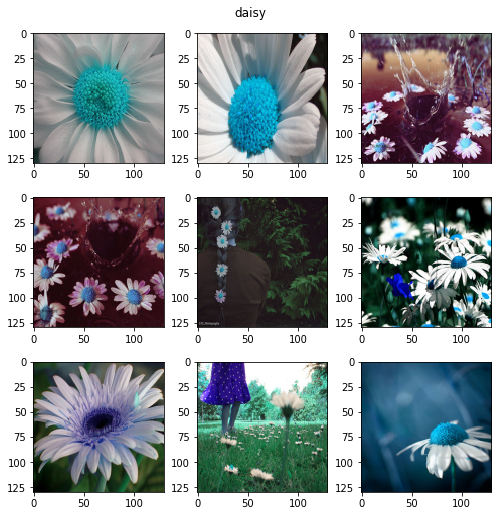

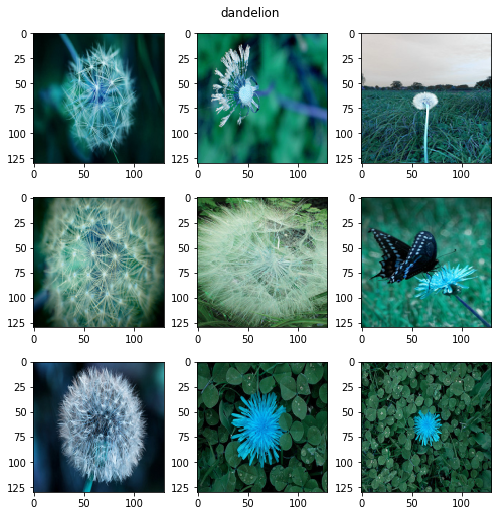

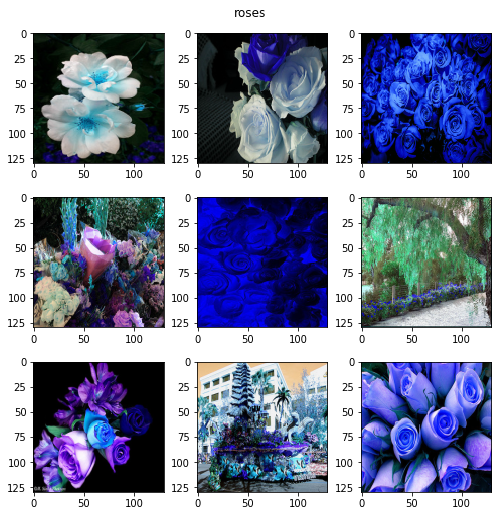

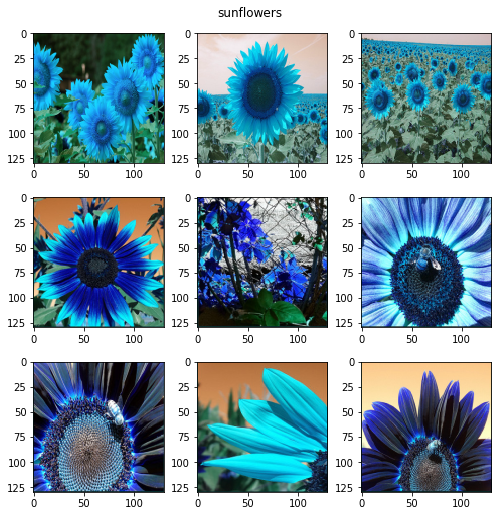

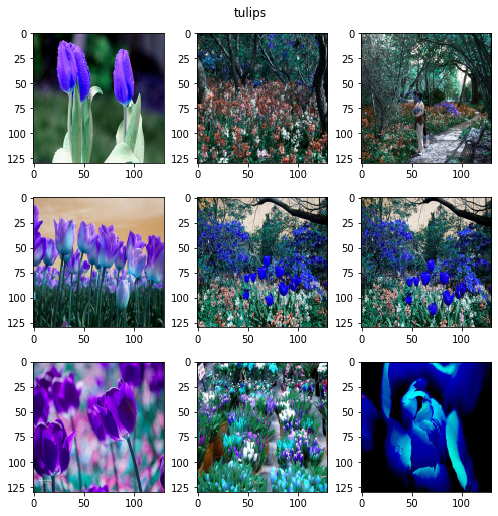

In [4]:
x_dat = []
y_dat = []

for flower_name in flower_list :
#     flower_name = flower_list[0]
    flower_dir = os.path.join(data_dir,flower_name)
    flower_png_list = os.listdir(flower_dir)
    x_data_list = np.array([cv2.resize(cv2.imread(os.path.join(flower_dir,s)), (130, 130), interpolation = cv2.INTER_AREA) for s in flower_png_list[0:100]])
    y_data_list = np.array([flower_name for s in range(x_data_list.shape[0])])
    
    # graph
    fig, ax = plt.subplots(3,3, figsize = (7,7))
    ax = ax.ravel()
    for i in range(9):
        ax[i].imshow(x_data_list[i])
    fig.tight_layout()    
    fig.suptitle(flower_name, y = 1.02)    
    
    x_dat.append(x_data_list)
    y_dat.append(y_data_list)

### 데이터 전처리

In [5]:
y_dat = np.array(y_dat).flatten()

In [6]:
onehot_y = np.array(pd.get_dummies(y_dat))
array_x = np.array(x_dat).reshape(len(y_dat),130,130,3)

Text(0.5, 1.02, 'tulips')

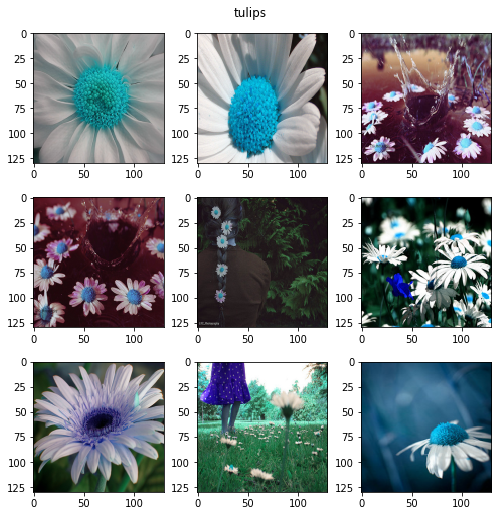

In [7]:
# graph
fig, ax = plt.subplots(3,3, figsize = (7,7))
ax = ax.ravel()
for i in range(9):
    ax[i].imshow(array_x[i])
fig.tight_layout()    
fig.suptitle(flower_name, y = 1.02)    

In [8]:
# Scale
array_x = (array_x-array_x.min())/(array_x.max() - array_x.min())

### CNN Model

In [9]:
# base CNN Model
input_layer = tf.keras.Input(shape = (130,130,3))
conv1 = tf.keras.layers.Conv2D(4, kernel_size = 3, padding = 'same', strides = 1, name = "conv1")(input_layer)
conv1 = tf.keras.layers.BatchNormalization( name = "conv1_nor")(conv1)
conv1 = tf.keras.layers.Activation('relu', name = "conv1_act")(conv1)
conv2 = tf.keras.layers.Conv2D(16, kernel_size = 3, padding = 'same', strides = 1, name = "conv2")(conv1)
conv2 = tf.keras.layers.BatchNormalization( name = "conv2_nor")(conv2)
conv2 = tf.keras.layers.Activation('relu', name = "conv2_act")(conv2)
faltten = tf.keras.layers.Flatten()(conv2)
output_layer = tf.keras.layers.Dense(5, activation = 'softmax')(faltten)
cnn_model = tf.keras.Model(inputs = input_layer, outputs = output_layer)

In [11]:
cnn_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 130, 130, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 130, 130, 4)       112       
                                                                 
 conv1_nor (BatchNormalizati  (None, 130, 130, 4)      16        
 on)                                                             
                                                                 
 conv1_act (Activation)      (None, 130, 130, 4)       0         
                                                                 
 conv2 (Conv2D)              (None, 130, 130, 16)      592       
                                                                 
 conv2_nor (BatchNormalizati  (None, 130, 130, 16)     64        
 on)                                                         

In [12]:
optim = tf.keras.optimizers.Adadelta(1e-2)
cnn_model.compile(optimizer=optim, loss='categorical_crossentropy')

### 초기 Feature Map

In [13]:
Feature_model_1 = tf.keras.Model(inputs = cnn_model.layers[0].input, outputs = cnn_model.layers[3].output)
Feature_model_2 = tf.keras.Model(inputs = cnn_model.layers[0].input, outputs = cnn_model.layers[6].output)

In [14]:
Feature_model_1_pred = Feature_model_1.predict(array_x)
Feature_model_2_pred = Feature_model_2.predict(array_x)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
16/16 [==============================] - 1s 43ms/step
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report

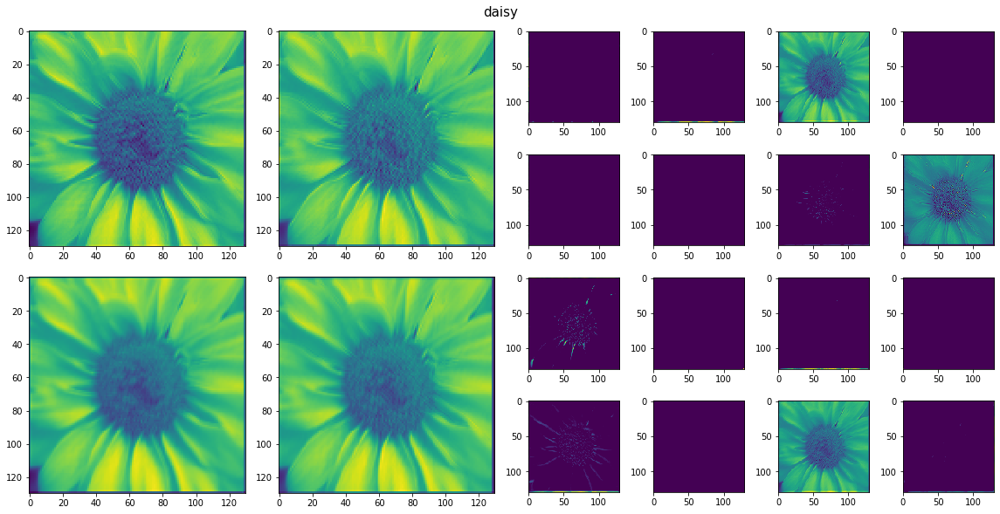

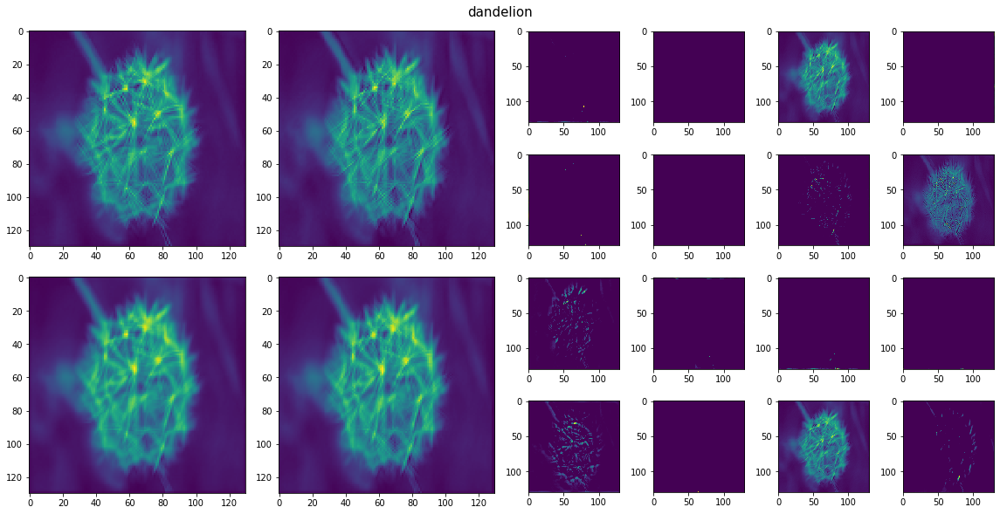

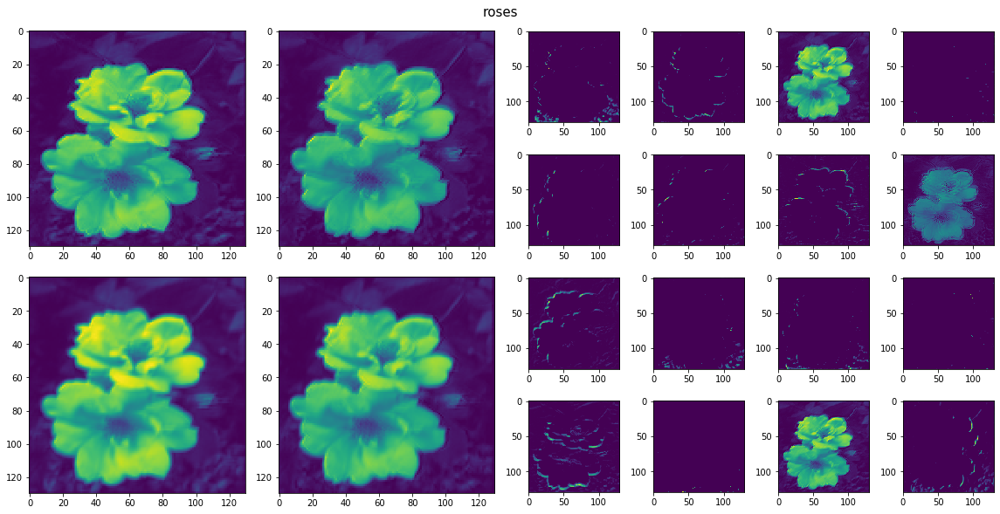

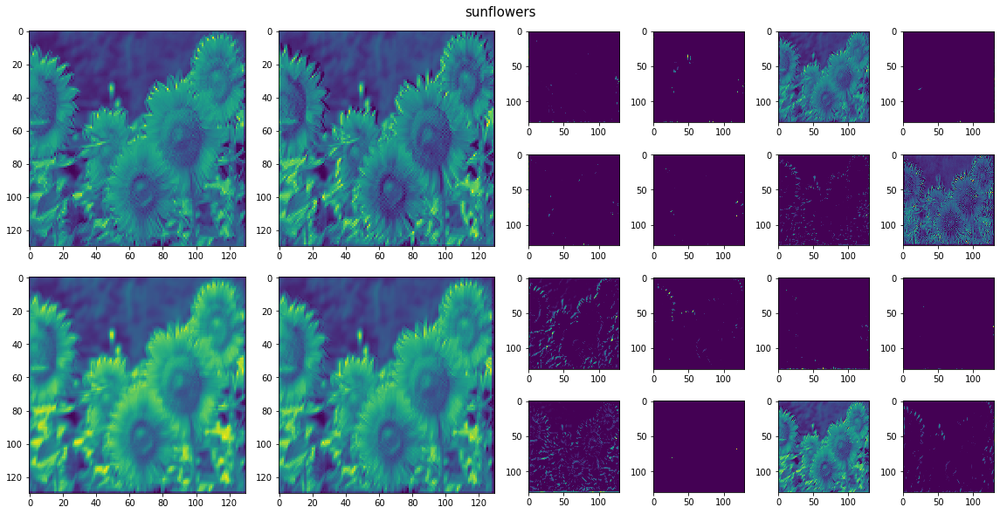

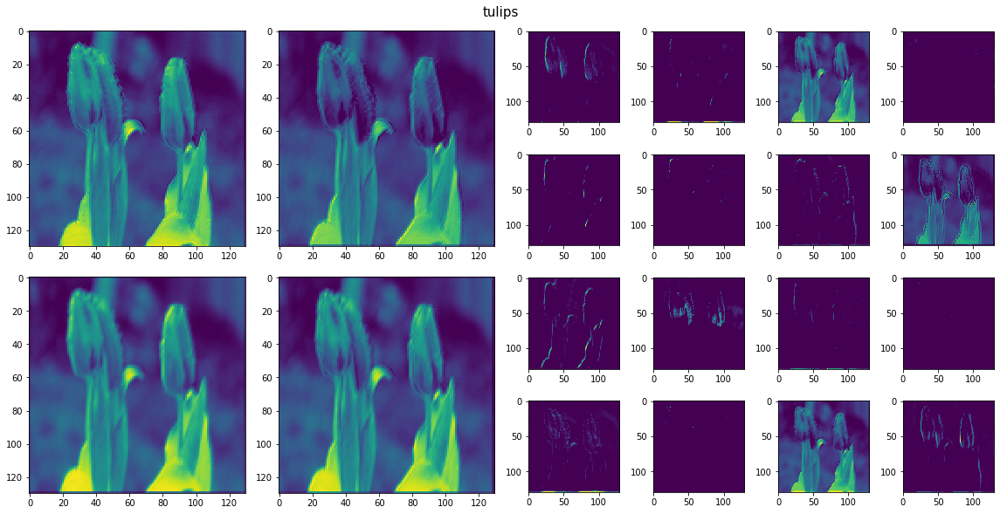

In [15]:
for flower_name in flower_list:
#     flower_name = flower_list[0]
    data_idx = 0
    feature_1 = Feature_model_1_pred[np.argwhere(y_dat == flower_name)][data_idx]
    feature_2 = Feature_model_2_pred[np.argwhere(y_dat == flower_name)][data_idx]
    
    # Conv Layer 1, Conv Layer 2 Feature Map 그래프 그리기
    
    fig=plt.figure(figsize = (16,8))
    gs=GridSpec(4,8)
    axes_list = []

    # AX 지정
    for x,y in list(itertools.product(range(4),range(8))):
        if (x == 0) and (y == 0) :
            axes_list.append(fig.add_subplot(gs[0:2,0:2]))
        if (x == 0) and (y == 2) :
            axes_list.append(fig.add_subplot(gs[0:2,2:4]))
        if (x == 2) and (y == 0) :
            axes_list.append(fig.add_subplot(gs[2:4,0:2]))
        if (x == 2) and (y == 2) :
            axes_list.append(fig.add_subplot(gs[2:4,2:4])) 

        if y >= 4:
            axes_list.append(fig.add_subplot(gs[x,y]))


    # 첫번째 Conv Layer Feature Map
    for i in range(feature_1.shape[-1]):
        axes_list[i].imshow(feature_1[0,:,:,i])    

    # 두번째 Conv Feature Map
    for i in range(feature_2.shape[-1]):
        axes_list[4+i].imshow(feature_2[0,:,:,i]) 

    fig.tight_layout()      
    fig.suptitle(flower_name, y = 1.02, fontsize = 15)

### 학습 시 Feature Map 변화

In [16]:
EPOCH = 50

EPOCH : 00
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
16/16 [==============================] - 6s 366ms/step - loss: 1.7042
EPOCH : 01
16/16 [==============================] - 6s 407ms/step - loss: 1.2735
EPOCH : 02
16/16 [==============================] - 7s 433ms/step - loss: 1.0683
EPOCH : 03
16/16 [==============================] - 6s 378ms/step - loss: 0.9210
EPOCH : 04
16/16 [==============================] - 6s

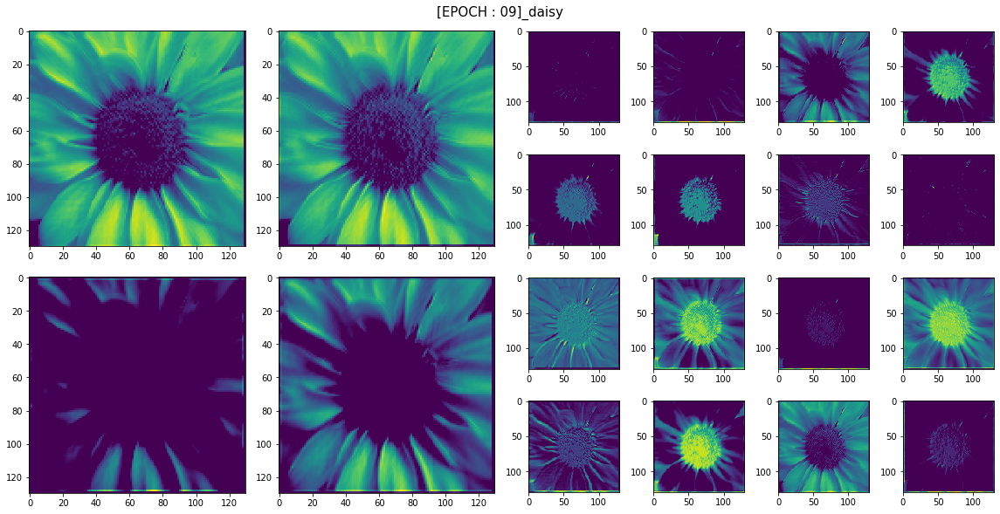

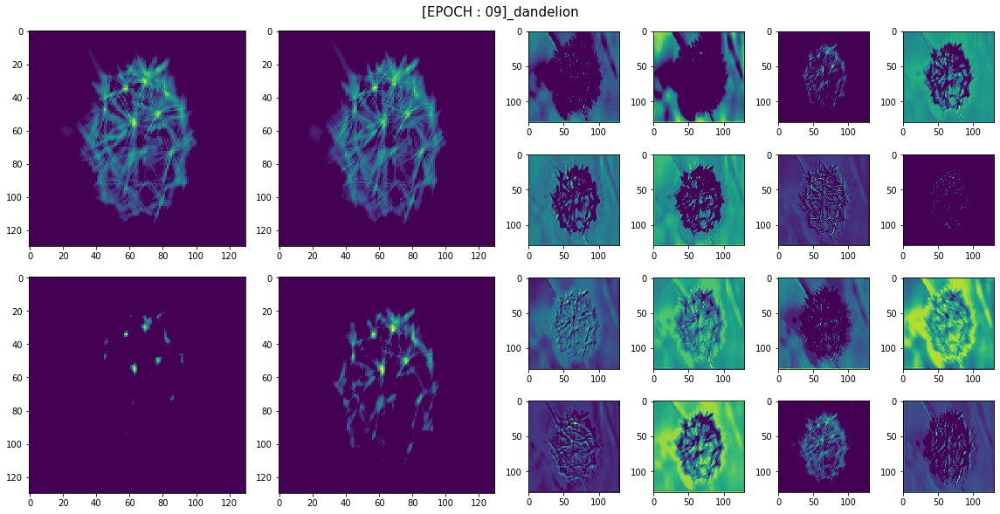

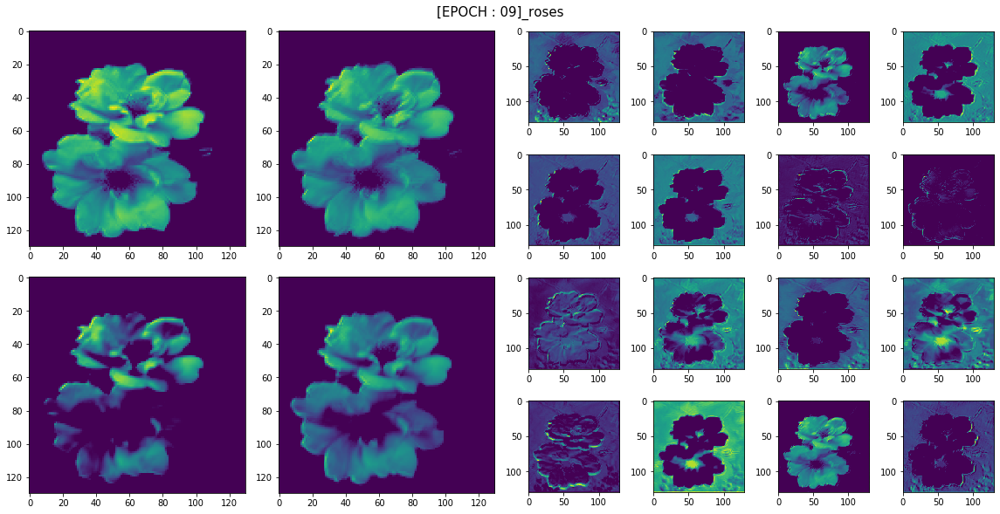

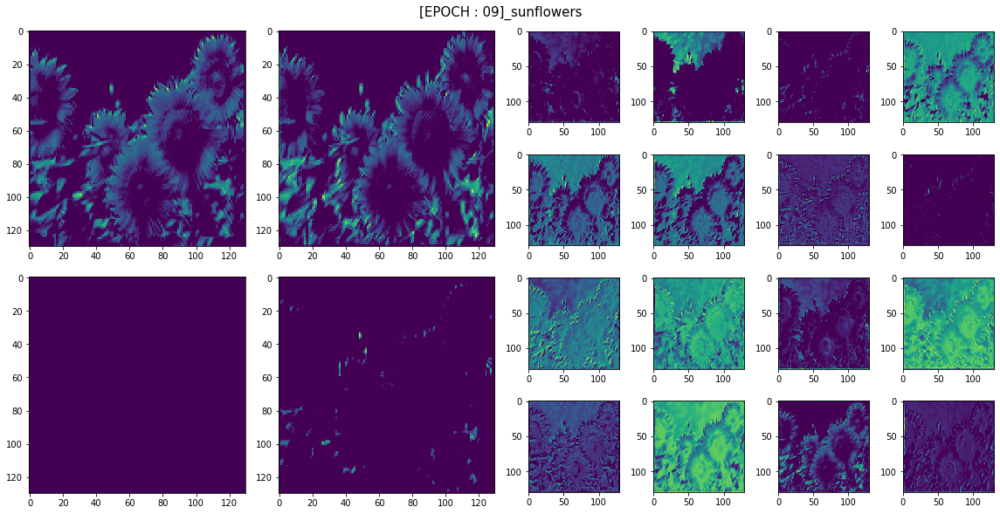

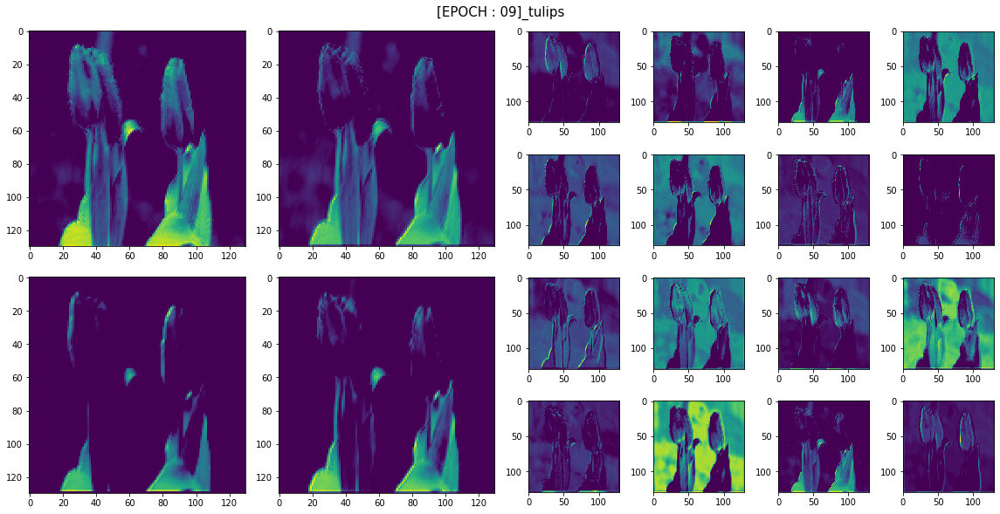

EPOCH : 10
16/16 [==============================] - 7s 438ms/step - loss: 0.3656
EPOCH : 11
16/16 [==============================] - 7s 464ms/step - loss: 0.3326
EPOCH : 12
16/16 [==============================] - 6s 391ms/step - loss: 0.3017
EPOCH : 13
16/16 [==============================] - 6s 393ms/step - loss: 0.2960
EPOCH : 14
16/16 [==============================] - 6s 386ms/step - loss: 0.2466
EPOCH : 15
16/16 [==============================] - 7s 431ms/step - loss: 0.2420
EPOCH : 16
16/16 [==============================] - 7s 436ms/step - loss: 0.2166
EPOCH : 17
16/16 [==============================] - 6s 396ms/step - loss: 0.1954
EPOCH : 18
16/16 [==============================] - 7s 431ms/step - loss: 0.1720
EPOCH : 19
16/16 [==============================] - 2s 94ms/step


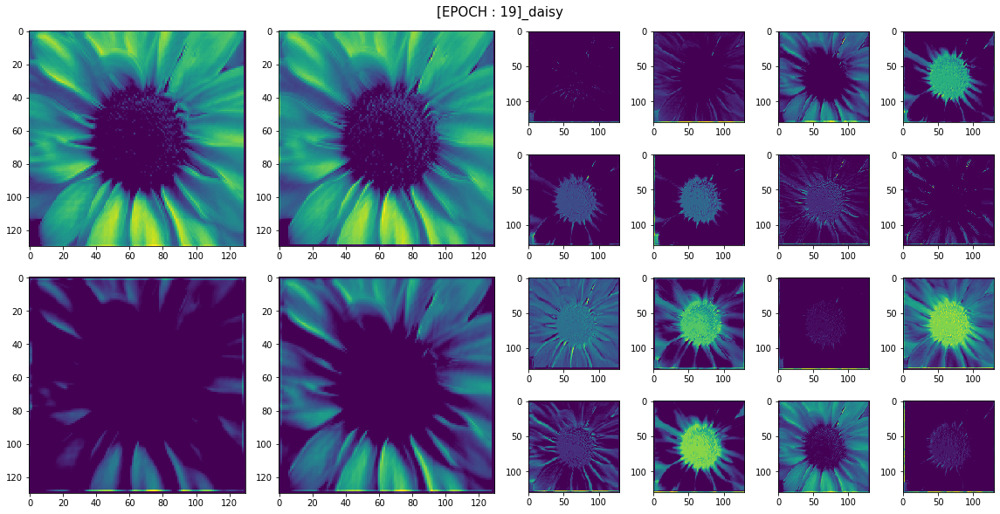

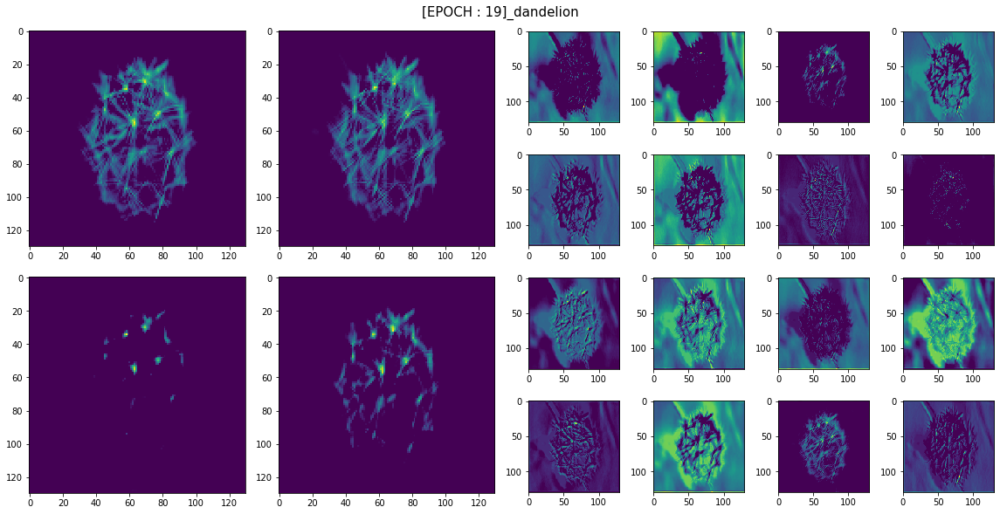

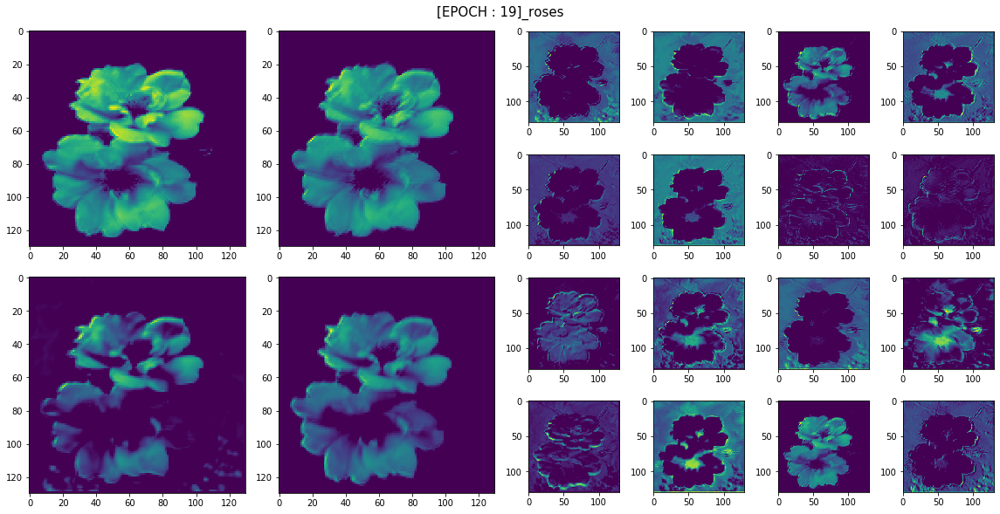

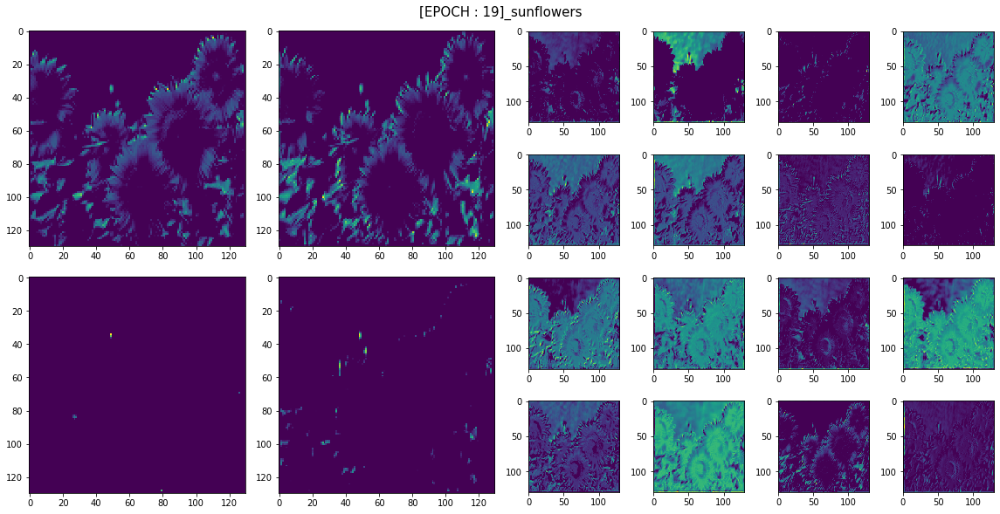

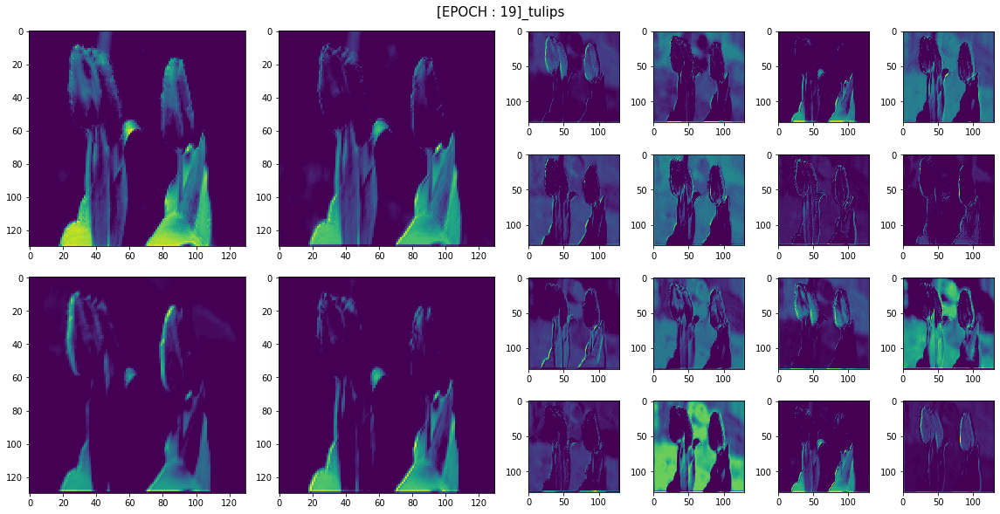

EPOCH : 20
16/16 [==============================] - 7s 428ms/step - loss: 0.1437
EPOCH : 21
16/16 [==============================] - 7s 426ms/step - loss: 0.1270
EPOCH : 22
16/16 [==============================] - 6s 380ms/step - loss: 0.1258
EPOCH : 23
16/16 [==============================] - 6s 394ms/step - loss: 0.1087
EPOCH : 24
16/16 [==============================] - 6s 387ms/step - loss: 0.1088
EPOCH : 25
16/16 [==============================] - 6s 406ms/step - loss: 0.0998
EPOCH : 26
16/16 [==============================] - 6s 378ms/step - loss: 0.0802
EPOCH : 27
16/16 [==============================] - 6s 381ms/step - loss: 0.0783
EPOCH : 28
16/16 [==============================] - 6s 374ms/step - loss: 0.0698
EPOCH : 29
16/16 [==============================] - 2s 107ms/step


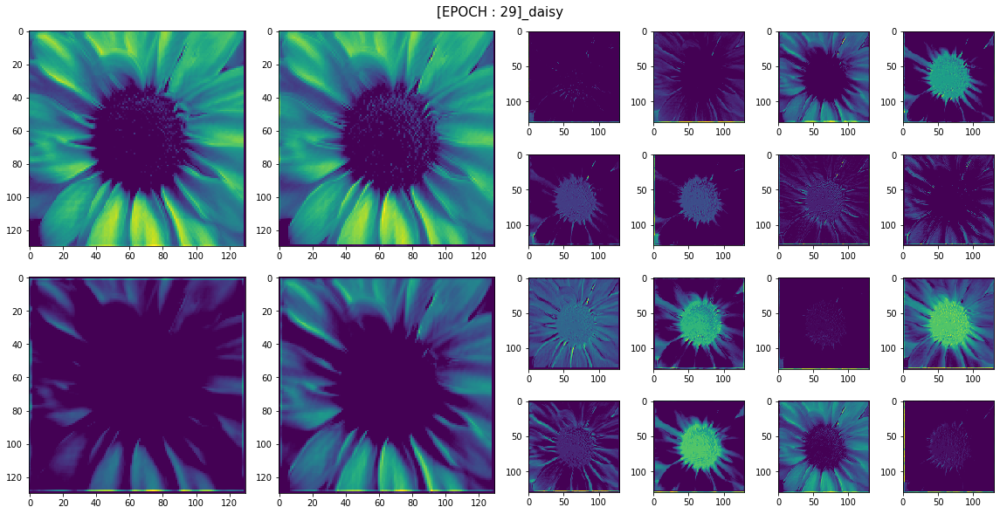

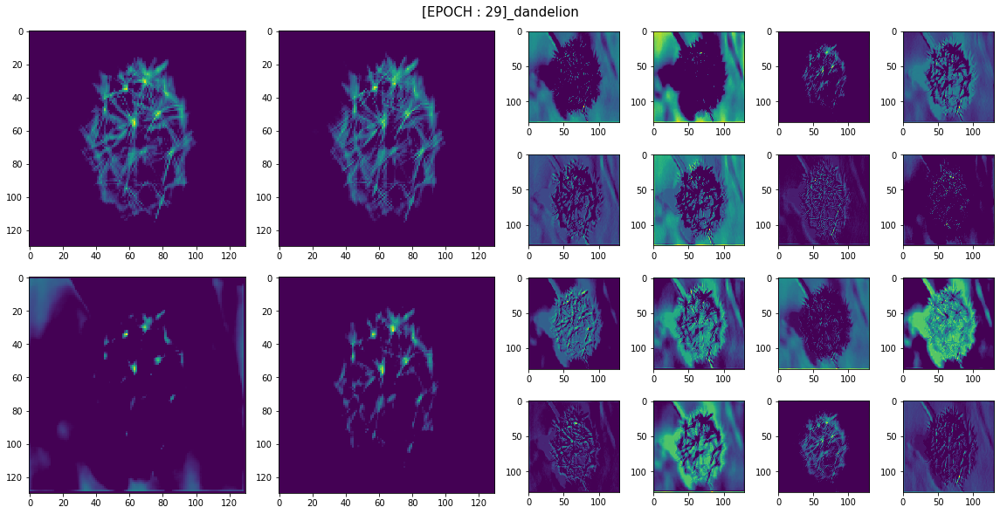

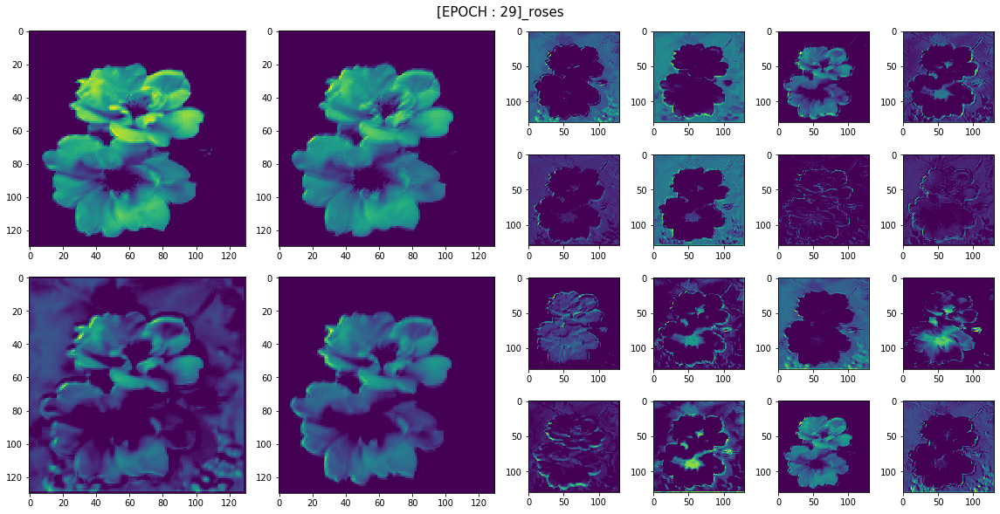

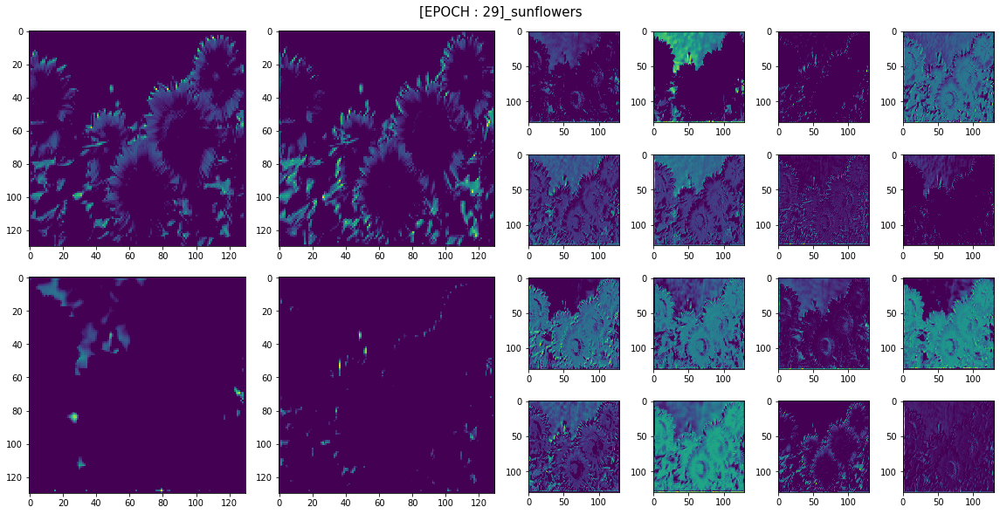

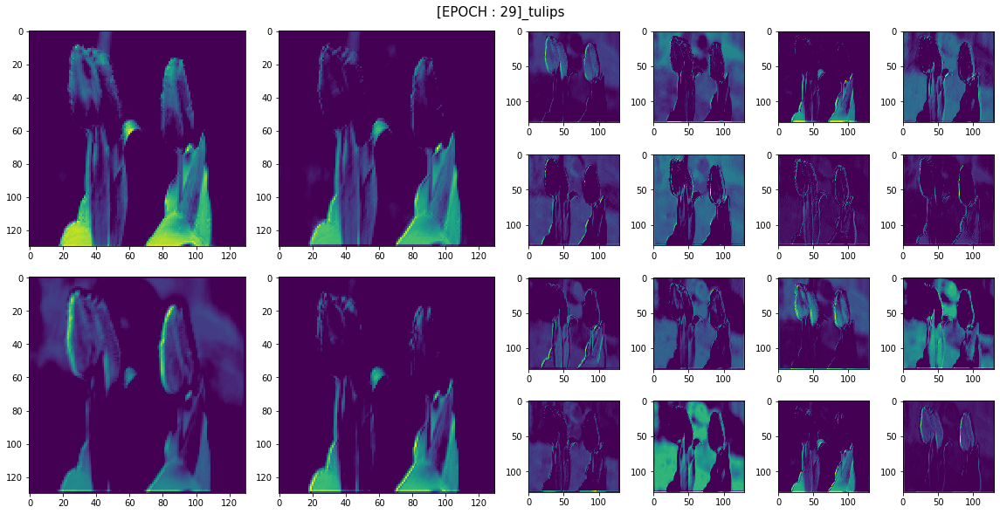

EPOCH : 30
16/16 [==============================] - 6s 378ms/step - loss: 0.0660
EPOCH : 31
16/16 [==============================] - 6s 358ms/step - loss: 0.0551
EPOCH : 32
16/16 [==============================] - 6s 368ms/step - loss: 0.0540
EPOCH : 33
16/16 [==============================] - 6s 389ms/step - loss: 0.0467
EPOCH : 34
16/16 [==============================] - 6s 380ms/step - loss: 0.0407
EPOCH : 35
16/16 [==============================] - 6s 379ms/step - loss: 0.0355
EPOCH : 36
16/16 [==============================] - 6s 371ms/step - loss: 0.0369
EPOCH : 37
16/16 [==============================] - 6s 397ms/step - loss: 0.0350
EPOCH : 38
16/16 [==============================] - 6s 376ms/step - loss: 0.0334
EPOCH : 39
16/16 [==============================] - 2s 119ms/step


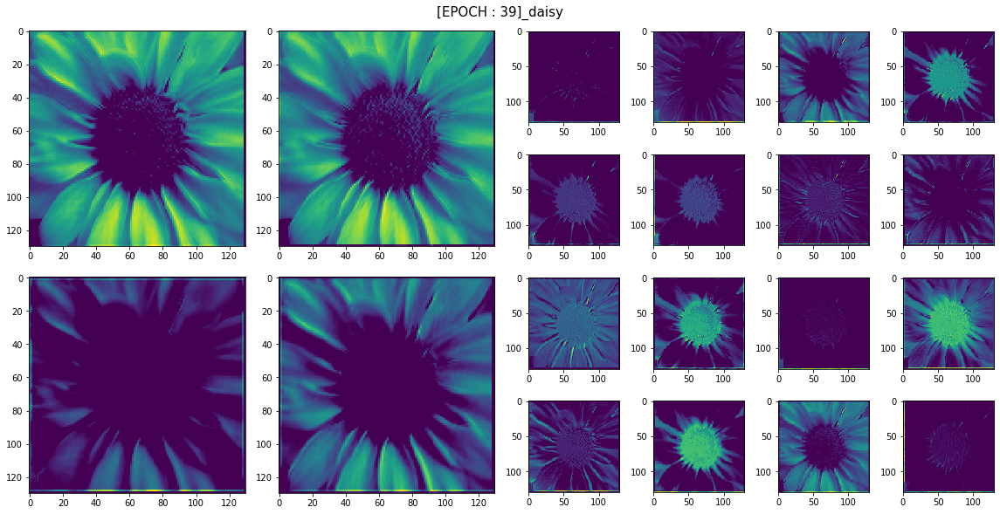

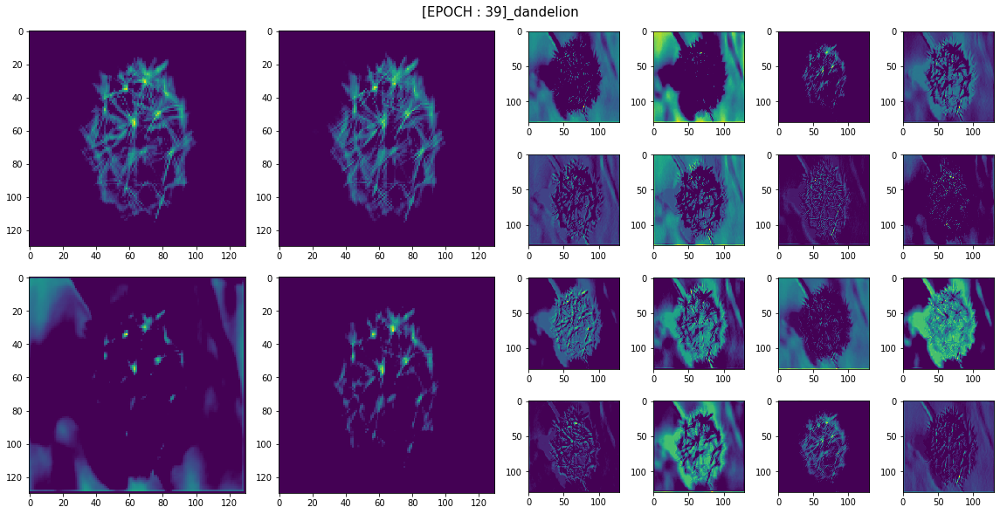

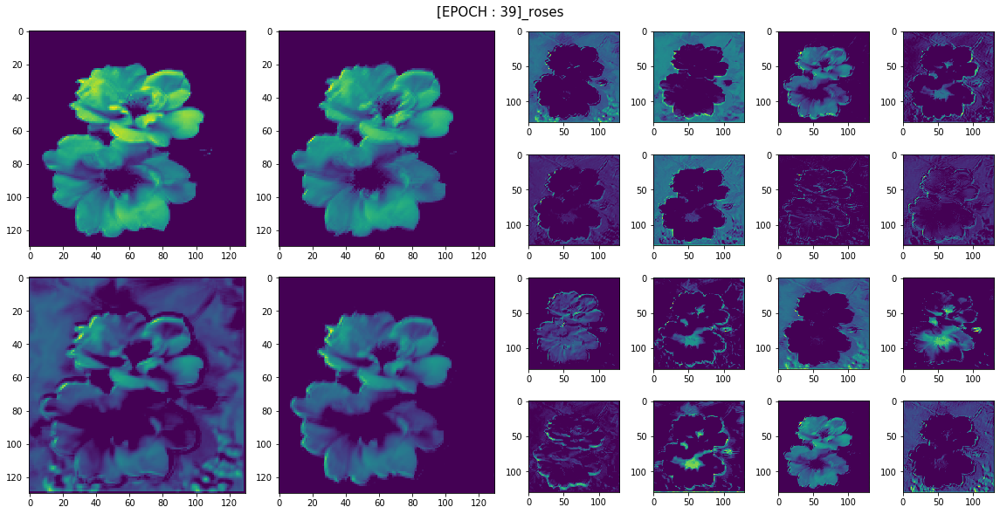

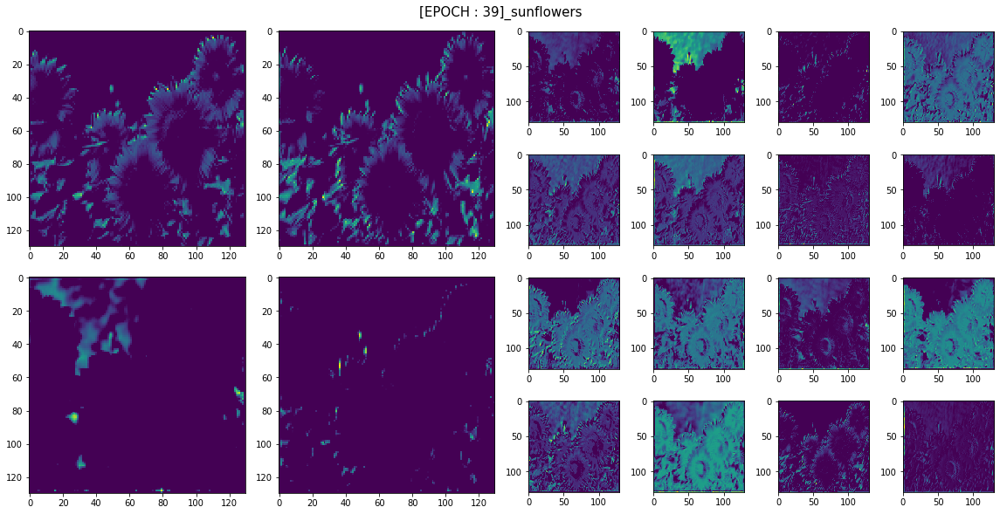

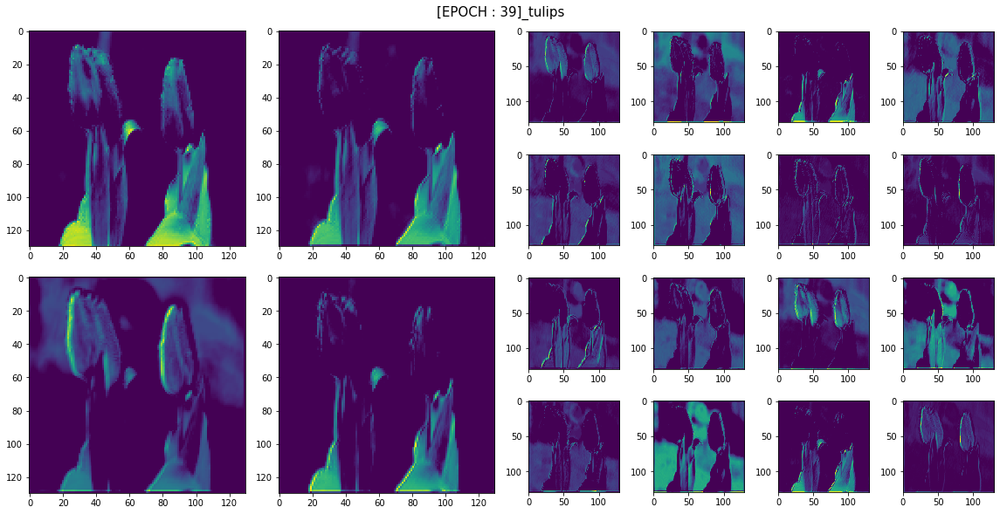

EPOCH : 40
16/16 [==============================] - 6s 403ms/step - loss: 0.0317
EPOCH : 41
16/16 [==============================] - 6s 369ms/step - loss: 0.0293
EPOCH : 42
16/16 [==============================] - 6s 387ms/step - loss: 0.0264
EPOCH : 43
16/16 [==============================] - 7s 463ms/step - loss: 0.0200
EPOCH : 44
16/16 [==============================] - 8s 479ms/step - loss: 0.0226
EPOCH : 45
16/16 [==============================] - 7s 442ms/step - loss: 0.0181
EPOCH : 46
16/16 [==============================] - 6s 407ms/step - loss: 0.0158
EPOCH : 47
16/16 [==============================] - 7s 425ms/step - loss: 0.0164
EPOCH : 48
16/16 [==============================] - 7s 420ms/step - loss: 0.0135
EPOCH : 49
16/16 [==============================] - 2s 109ms/step


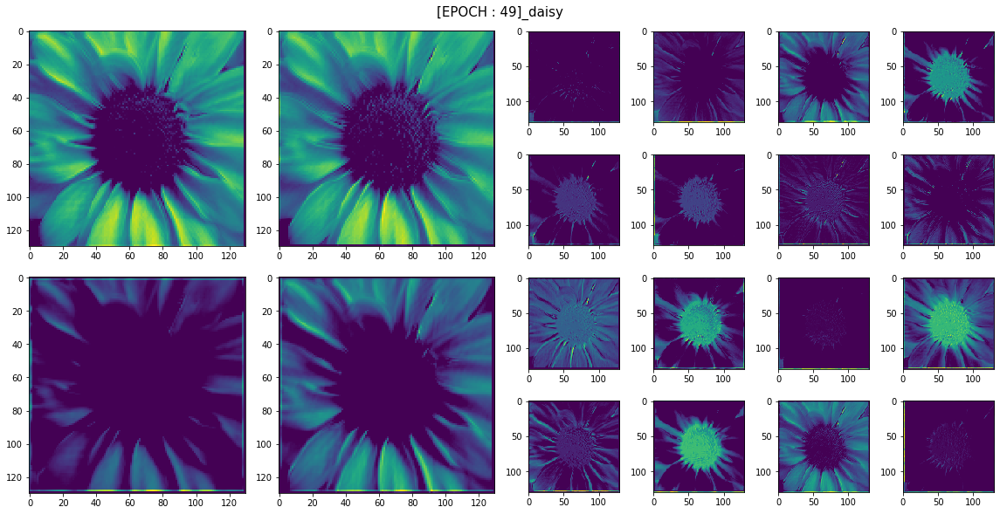

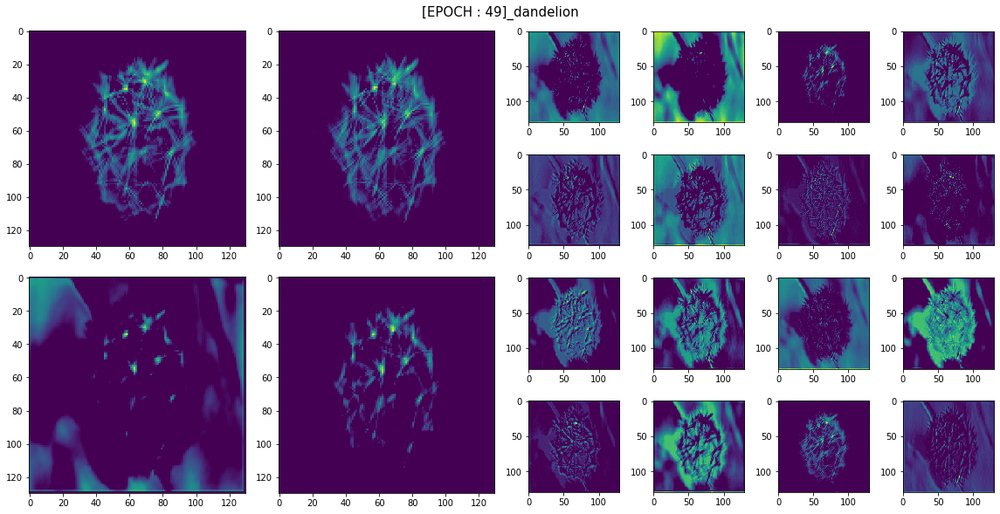

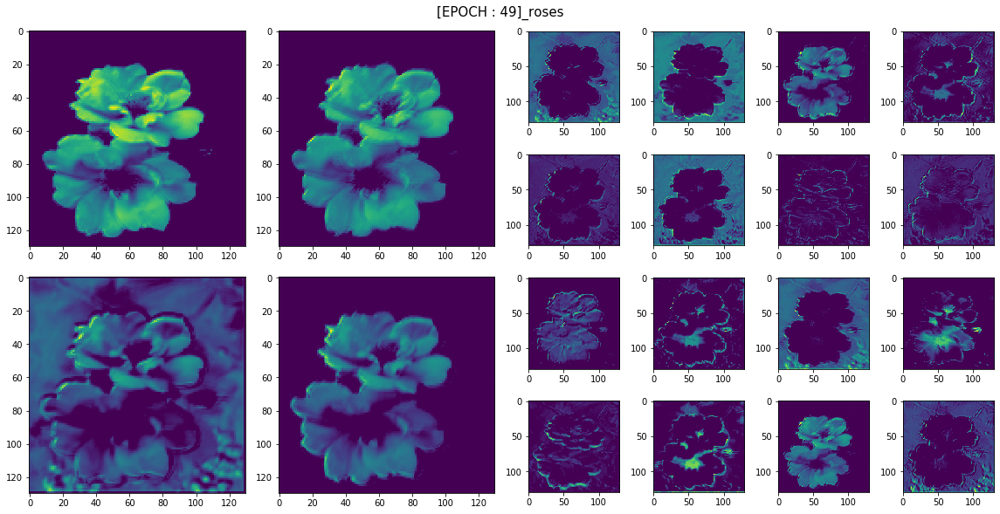

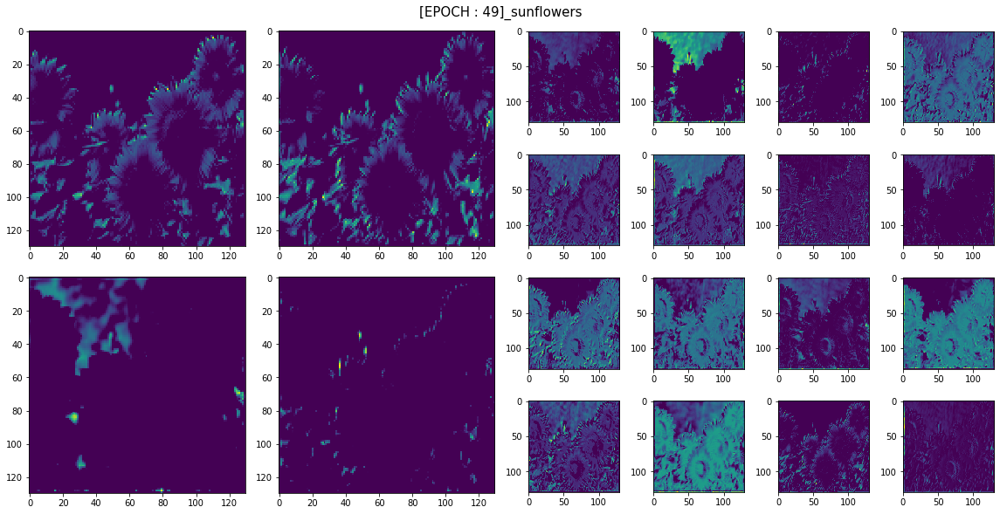

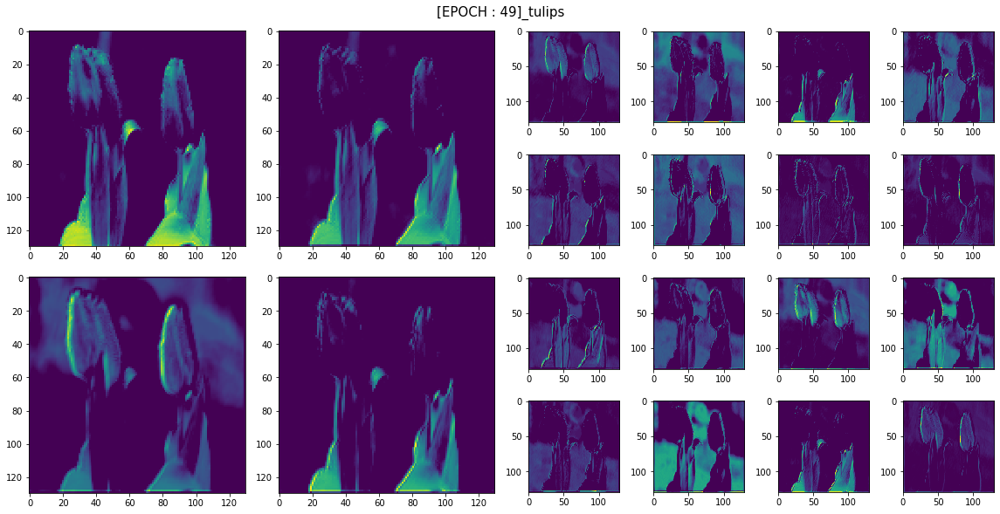

In [17]:
for epoch in range(EPOCH) :
    print(f'EPOCH : {str(epoch).zfill(2)}')
    cnn_model.fit(array_x,onehot_y, epochs = 1, verbose=1)
    
    # 10 EPOCH 마다 Feature Map 그리기
    if (epoch + 1)%10 == 0 :
        
        # 10 EPOCH 후 Feature Map 다시 추출하기
        Feature_model_1_pred = Feature_model_1.predict(array_x)
        Feature_model_2_pred = Feature_model_2.predict(array_x)
        
        for flower_name in flower_list:
        #     flower_name = flower_list[0]
            data_idx = 0
            feature_1 = Feature_model_1_pred[np.argwhere(y_dat == flower_name)][data_idx]
            feature_2 = Feature_model_2_pred[np.argwhere(y_dat == flower_name)][data_idx]

            # Conv Layer 1, Conv Layer 2 Feature Map 그래프 그리기

            fig=plt.figure(figsize = (16,8))
            gs=GridSpec(4,8)
            axes_list = []

            # AX 지정
            for x,y in list(itertools.product(range(4),range(8))):
                if (x == 0) and (y == 0) :
                    axes_list.append(fig.add_subplot(gs[0:2,0:2]))
                if (x == 0) and (y == 2) :
                    axes_list.append(fig.add_subplot(gs[0:2,2:4]))
                if (x == 2) and (y == 0) :
                    axes_list.append(fig.add_subplot(gs[2:4,0:2]))
                if (x == 2) and (y == 2) :
                    axes_list.append(fig.add_subplot(gs[2:4,2:4])) 

                if y >= 4:
                    axes_list.append(fig.add_subplot(gs[x,y]))


            # 첫번째 Conv Layer Feature Map
            for i in range(feature_1.shape[-1]):
                axes_list[i].imshow(feature_1[0,:,:,i])    

            # 두번째 Conv Feature Map
            for i in range(feature_2.shape[-1]):
                axes_list[4+i].imshow(feature_2[0,:,:,i]) 

            fig.tight_layout()      
            fig.suptitle(f'[EPOCH : {str(epoch).zfill(2)}]_' + flower_name, y = 1.02, fontsize = 15)
            plt.show()